In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
from sklearn import metrics
import tabulate
import itertools
import umap
from importlib import reload
from scipy import stats
import matplotlib.image as mpimg
import goatools
from goatools.anno.gaf_reader import GafReader
import Bio.UniProt.GOA as GOA
import gget

# locals
import utils as ut
reload(ut)

2022-11-16 09:05:16.967894: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-16 09:05:17.082850: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/slurm/lib64:
2022-11-16 09:05:17.082876: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-11-16 09:05:17.109531: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-16 09:05:18.0712

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/utils.py'>

In [2]:
sc.settings.verbosity = 3

In [3]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scRNAseq/"

adata = {}

for f in os.listdir(dirPath):
    
    if not f == "all":
        cond = f
        mtxPath = f"{dirPath}{f}"
        data = sc.read_10x_mtx(mtxPath, cache=True)
        data.var_names = [x.upper() for x in data.var_names] # uppercase gene names
        adata[cond] = data
    
print("done")

... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD14-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-ND-matrix.h5ad
... reading from cache file cache/nfs-turbo-umms-indikar-shared-projects-spatial_transcriptomics-data-scRNAseq-HFD8-matrix.h5ad
done


# Filters

In [4]:
# ?sc.pp.scale

In [5]:
min_genes = 500
min_cells = 10

for d, data in adata.items():
    print(d)
    sc.pp.filter_cells(data, min_genes=min_genes)
    sc.pp.filter_genes(data, min_cells=min_cells)
    sc.pp.normalize_total(data, target_sum=1e6) # Normalize each cell by total counts over all genes (CPM)
    sc.pp.log1p(data) # Logarithmize data via `X = \log(X + 1)`,
    # sc.pp.scale(data) # unit variance and zero mean #NOTE: this introduces negative values that prevent LFC calculations

HFD14
filtered out 710 cells that have less than 500 genes expressed
filtered out 17574 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
ND
filtered out 153 cells that have less than 500 genes expressed
filtered out 18563 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)
HFD8
filtered out 435 cells that have less than 500 genes expressed
filtered out 17285 genes that are detected in less than 10 cells
normalizing counts per cell
    finished (0:00:00)


# Clustering

In [6]:
# ?sc.tl.leiden
# ?sc.pl.umap
# sc.pp.neighbors

In [7]:
runKeys = []

In [8]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

# the big choices
n_neighbors = 9
n_pcs = 50
resolution = 0.95

runKey = f"nn{n_neighbors}_pca{n_pcs}_r{resolution}"
print(runKey)
runKeys.append(runKey)

"""The parameter functions as a sort of threshold: communities should have a density of at least γ, 
while the density between communities should be lower than γ. 
Higher resolutions lead to more communities and lower resolutions lead to fewer communities, 
similarly to the resolution parameter for modularity."""

# clustering
for d, data in adata.items():
    
    # 1. project into low-dimensional space
    sc.tl.pca(data, 
              n_comps=n_pcs, 
              svd_solver='arpack')
    
    # 2. build neighborhood graph
    sc.pp.neighbors(data, 
                    n_neighbors=n_neighbors)
    
    # just for visualization purposes 
    sc.tl.umap(data)
    
    # 3. modularity clustering via leiden algorithm
    sc.tl.leiden(data,
                 resolution=resolution,
                 key_added=runKey)
    
    # break
print('DONE.')

nn9_pca50_r0.95
computing PCA
    with n_comps=50
    finished (0:00:28)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
running Leiden clustering
    finished: found 20 clusters and added
    'nn9_pca50_r0.95', the cluster labels (adata.obs, categorical) (0:00:00)
computing PCA
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)
running Leiden clustering
    finished: found 18 clusters and added
    'nn9_pca50_r0.95', th

# Cluster Metrics

In [9]:
keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    labels = data.obs[runKey].astype(int).to_numpy()
    n = len(set(labels))
    # X = data.obsp['connectivities'].todense()
    X = data.obsm['X_umap']
    sil = metrics.silhouette_score(X, labels, metric='euclidean')
    
    print(f"{key} {n} clusters Silhouette: {sil:.4f} (UMAP Projection)")

ND 18 clusters Silhouette: 0.4157 (UMAP Projection)
HFD8 25 clusters Silhouette: 0.3488 (UMAP Projection)
HFD14 20 clusters Silhouette: 0.2557 (UMAP Projection)


# Score marker genes

## pangloadb

In [10]:
choose = 50 # number of genes to consider

# load gene lists 
pandPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/panglaodb/pandb.tsv.gz"        
pandf = ut.read_panglaodb(pandPath)

controlList = [
    'Adipocytes',
    'B cells', 
    'Dendritic cells',
    'Macrophages',
    'Monocytes', 
    'NK cells',
    'T cells', 
]

allMarkers = pandf[pandf['cell type'].isin(controlList)]
print(pd.DataFrame(allMarkers['cell type'].value_counts()))
print()
"""
Ubiquitousness Index (0-1). 
0 indicates the gene is not expressed in any cell cluster and 
1 (maximum) indicates that the gene is expressed in all cell clusters. 
"""

mfList = []

for ctype in controlList:
    cf = allMarkers[allMarkers['cell type'] == ctype]
    
    cf = cf.sort_values(by='ubiquitousness index',
                        ascending=True)
    
    mfList.append(cf[['cell type', 'gene']].head(choose))


markerGenes = pd.concat(mfList, ignore_index=True)

"""NOTE: RENAME THE STROMAL CELL POPULATION"""
markerGenes.loc[markerGenes['cell type'] == 'Adipocytes', 'cell type'] = 'Stromal cells'
allMarkers.loc[allMarkers['cell type'] == 'Adipocytes', 'cell type'] = 'Stromal cells'

print()
print(markerGenes.head())


print('done')

                 cell type
Macrophages            153
Dendritic cells        133
Adipocytes             120
B cells                110
T cells                107
Monocytes              102
NK cells                98


       cell type     gene
0  Stromal cells     MC2R
1  Stromal cells     TLR4
2  Stromal cells  LGALS12
3  Stromal cells  CYP11B2
4  Stromal cells    PLIN1
done


# rank genes

In [11]:
method = 't-test'
# method = 'wilcoxon'

n_genes = 5000

"""NOTE: can use different run keys"""

for d, data in adata.items():    
    sc.tl.rank_genes_groups(data, 
                            runKey, 
                            # n_genes=n_genes,
                            method=method)
    
print("done")

ranking genes


... storing 'feature_types' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
ranking genes


... storing 'feature_types' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
ranking genes


... storing 'feature_types' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
done


/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/cstansbu/.local/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmente

In [12]:
# ?sc.tl.rank_genes_groups

In [13]:
keys = ['ND', 'HFD8', 'HFD14']
topNgenes = 200

enrichr = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    cid = {}
            
    for clusterId in groups:
        genes = result['names'][clusterId][:topNgenes]
        edf = gget.enrichr(genes, database="celltypes")
        edf['clusterId'] = clusterId
        
        cid[int(clusterId)+1] = edf
    enrichr[key] = cid
    
print(groups)
print()
print(cid.keys())
print("done")

Wed Nov 16 09:07:07 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Wed Nov 16 09:07:08 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Wed Nov 16 09:07:08 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate database for your application. 
    Go to https://maayanlab.cloud/Enrichr/#libraries for a full list of supported databases.
    
Wed Nov 16 09:07:09 2022 INFO Performing Enichr analysis using database PanglaoDB_Augmented_2021. 
    Please note that there might a more appropriate databa

('0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19')

dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])
done


In [14]:
geneLists = {}

useABS = False
expon = 7
normRank = True
expRank = True
keys = ['ND', 'HFD8', 'HFD14']

scoreFrame = {}

for key in keys:
    data = adata[key] 
    result = data.uns['rank_genes_groups']
    keys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    
    newRows = []
    
    for ctype in markerGenes['cell type'].unique():
        ctypeSig = markerGenes[markerGenes['cell type'] == ctype]['gene'].to_list()
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            
            # use the abs score
            if useABS:
                t['scores'] = np.abs(t['scores'])
                
            t = t.sort_values(by='scores', ascending=False)
            t['rank'] = t['scores'].rank()
            
            if normRank:
                t['rank'] = t['rank'].apply(lambda x: x / len(t)) # normalize rank
                
            if expRank:
                t['rank'] = np.exp(t['rank']**expon) / np.exp(1)
                
            matches = t[t['gene'].isin(ctypeSig)].reset_index()
            s = matches['rank'].mean()
            
            row = {
                'key' : key,
                'cellType' : ctype,
                'clusterId' : int(clusterId) + 1,
                'score' : s,
            }
            
            newRows.append(row)

    res = pd.DataFrame(newRows)
    scoreFrame[key] = res

print(scoreFrame['ND'].head())

  key       cellType  clusterId     score
0  ND  Stromal cells          1  0.380125
1  ND  Stromal cells          2  0.403939
2  ND  Stromal cells          3  0.445598
3  ND  Stromal cells          4  0.398800
4  ND  Stromal cells          5  0.436264


In [15]:
"""
compute the differences between the top and second scoring cell types
"""

scoreDiffs = {}

for k, df in scoreFrame.items():
    newRows = []
    for cid in df['clusterId'].unique():
        
        cf = df[df['clusterId'] == cid]
        
        cf = cf.sort_values(by='score', ascending=False).reset_index(drop=True)
        
        top = cf.iloc[0]
        second = cf.iloc[1]
        
        row = {
            'clusterId' : cid,
            'topCellType' : cf.iloc[0]['cellType'],
            'topScore' : cf.iloc[0]['score'],
            'secondCellType' : cf.iloc[1]['cellType'],
            'secondScore' : cf.iloc[1]['score'],
            'scoreDiff' : float(cf.iloc[0]['score']) - float(cf.iloc[1]['score'])
        }
        newRows.append(row)
    scoreDiffs[k] = pd.DataFrame(newRows)    

print(scoreDiffs['HFD8']['scoreDiff'].min())
print(scoreDiffs['HFD8']['scoreDiff'].mean())
scoreDiffs['HFD8']

0.005828828291900123
0.09149782703469012


,clusterId,topCellType,topScore,secondCellType,secondScore,scoreDiff
0,1,Dendritic cells,0.593149,Macrophages,0.481706,0.111443
1,2,T cells,0.723521,NK cells,0.562725,0.160796
2,3,NK cells,0.835738,T cells,0.587824,0.247914
3,4,Macrophages,0.499825,Monocytes,0.427404,0.072421
4,5,Monocytes,0.618942,Macrophages,0.486550,0.132392
5,6,Macrophages,0.516957,Dendritic cells,0.500417,0.016539
6,7,T cells,0.519932,NK cells,0.514103,0.005829
7,8,Macrophages,0.586173,Monocytes,0.569696,0.016477
8,9,B cells,0.753567,Dendritic cells,0.468220,0.285347
9,10,Macrophages,0.544161,Monocytes,0.475180,0.068982


In [16]:
def cellTypebyMax(df):
    """A function to assign cluster ids to the max score"""
    # df['max_score'] = df.groupby('clusterId')['score'].transform('max')
    df = df.sort_values(by=['score', 'clusterId'], ascending=[False, True])
    df = df.drop_duplicates(subset=['clusterId'])
    return df

res = cellTypebyMax(scoreFrame['HFD14'])
res

,key,cellType,clusterId,score
130,HFD14,T cells,11,0.789174
113,HFD14,NK cells,14,0.782553
32,HFD14,B cells,13,0.758888
39,HFD14,B cells,20,0.662768
83,HFD14,Monocytes,4,0.622663
47,HFD14,Dendritic cells,8,0.616035
56,HFD14,Dendritic cells,17,0.557978
17,HFD14,Stromal cells,18,0.546631
55,HFD14,Dendritic cells,16,0.539215
68,HFD14,Macrophages,9,0.539029


6 B cells
2 B cells
4 B cells
8 Dendritic cells
14 Dendritic cells
18 Dendritic cells
16 Dendritic cells
1 Macrophages
11 Macrophages
15 Macrophages
3 Macrophages
10 Monocytes
5 Monocytes
17 Monocytes
7 NK cells
12 Stromal cells
9 T cells
13 T cells


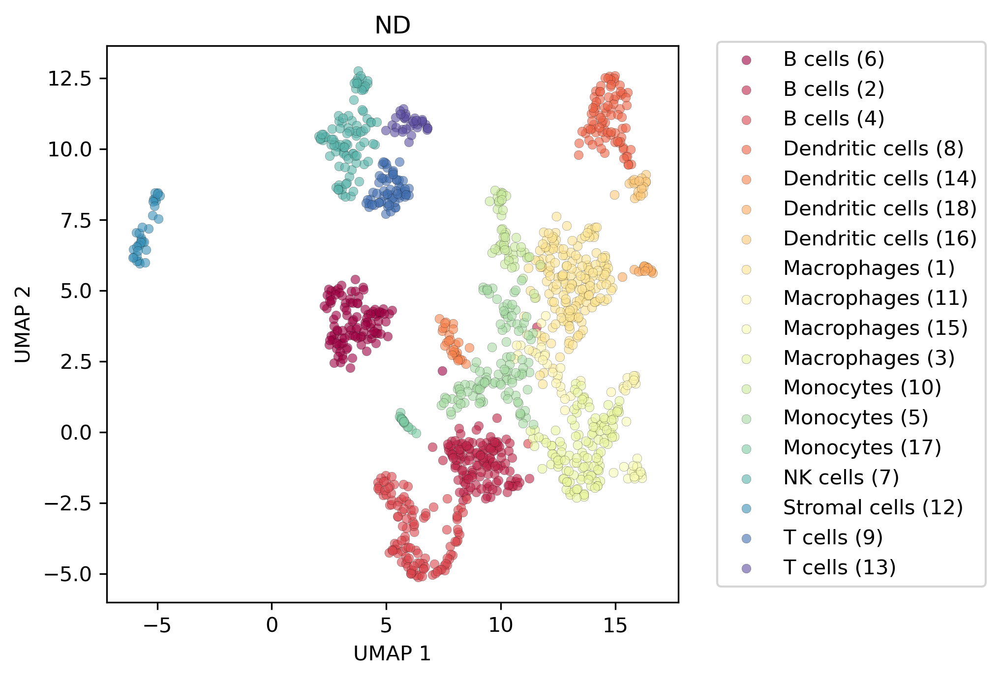

9 B cells
17 Dendritic cells
19 Dendritic cells
1 Dendritic cells
16 Dendritic cells
10 Macrophages
11 Macrophages
6 Macrophages
14 Macrophages
4 Macrophages
22 Macrophages
8 Macrophages
12 Macrophages
13 Monocytes
5 Monocytes
24 Monocytes
25 Monocytes
3 NK cells
23 Stromal cells
21 Stromal cells
15 T cells
7 T cells
20 T cells
18 T cells
2 T cells


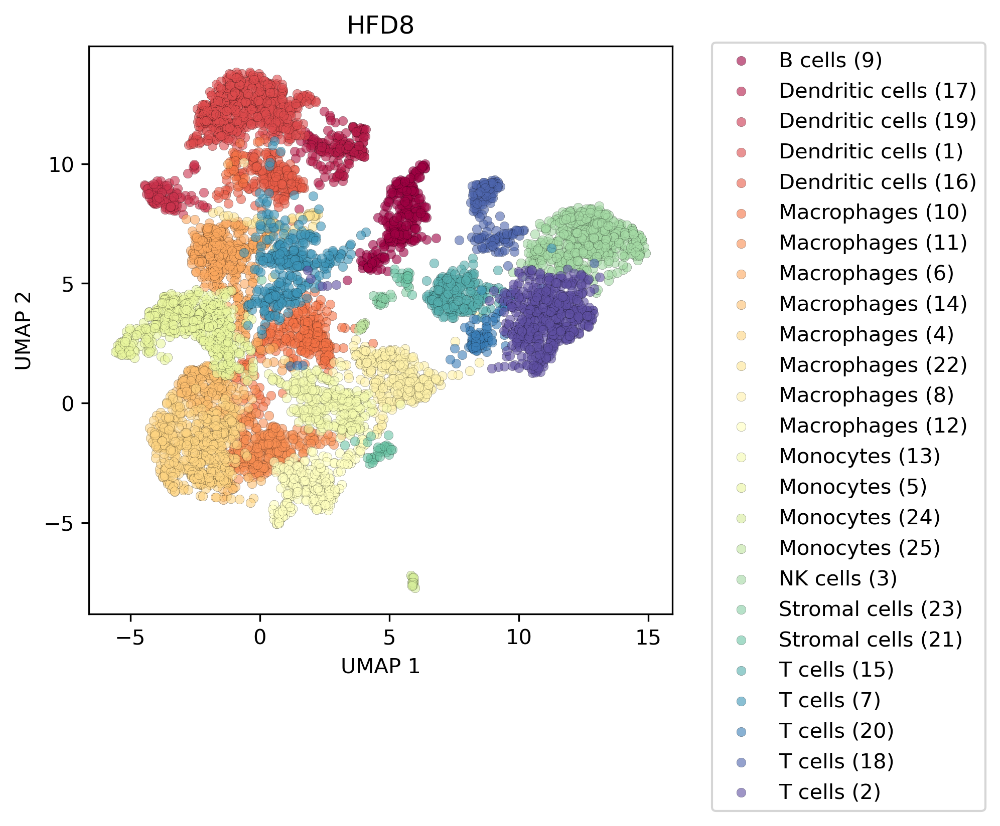

13 B cells
20 B cells
8 Dendritic cells
17 Dendritic cells
16 Dendritic cells
12 Dendritic cells
9 Macrophages
3 Macrophages
1 Macrophages
2 Macrophages
15 Macrophages
5 Macrophages
10 Macrophages
6 Macrophages
4 Monocytes
7 Monocytes
19 Monocytes
14 NK cells
18 Stromal cells
11 T cells


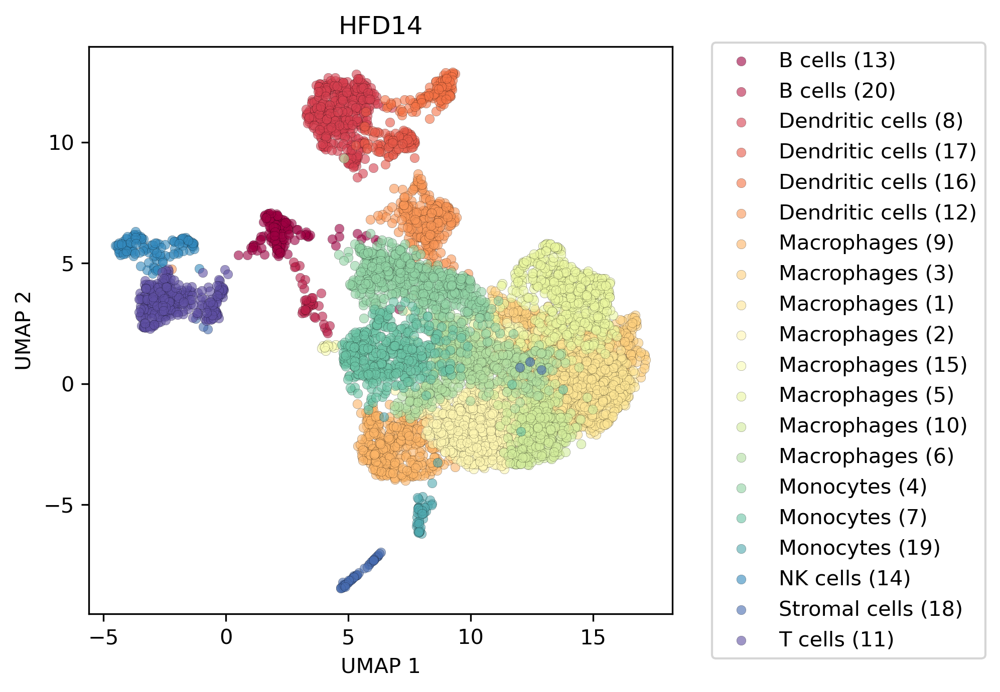

In [17]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 5, 5

keys = ['ND', 'HFD8', 'HFD14']


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    
    k = data.obs[runKey].nunique()
    colorlist = ut.ncolor(k, cmap='Spectral')
    
    embedding = data.obsm['X_umap']
    
    
    cellTypes = cellTypes.sort_values(by='cellType')
    colorInd = 0
    for idx, row in cellTypes.iterrows():
        c = colorlist[colorInd]
        colorInd += 1
        label = row['cellType']
        i = row['clusterId']
        
        print(i, label)
        
        plt.scatter(embedding[clusterIds == (i-1) , 0] , 
                    embedding[clusterIds == (i-1) , 1] , 
                    c=c,
                    edgecolor="k",
                    linewidth=0.1,
                    s=20,
                    alpha=0.6,
                    label=f"{label} ({i})",)
    
    plt.title(key)
    plt.legend(bbox_to_anchor=(1.05, 1.025))
#     # handles, labels = plt.gca().get_legend_handles_labels()
#     # labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
#     # plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.025))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    plt.show()

# Color by cell type

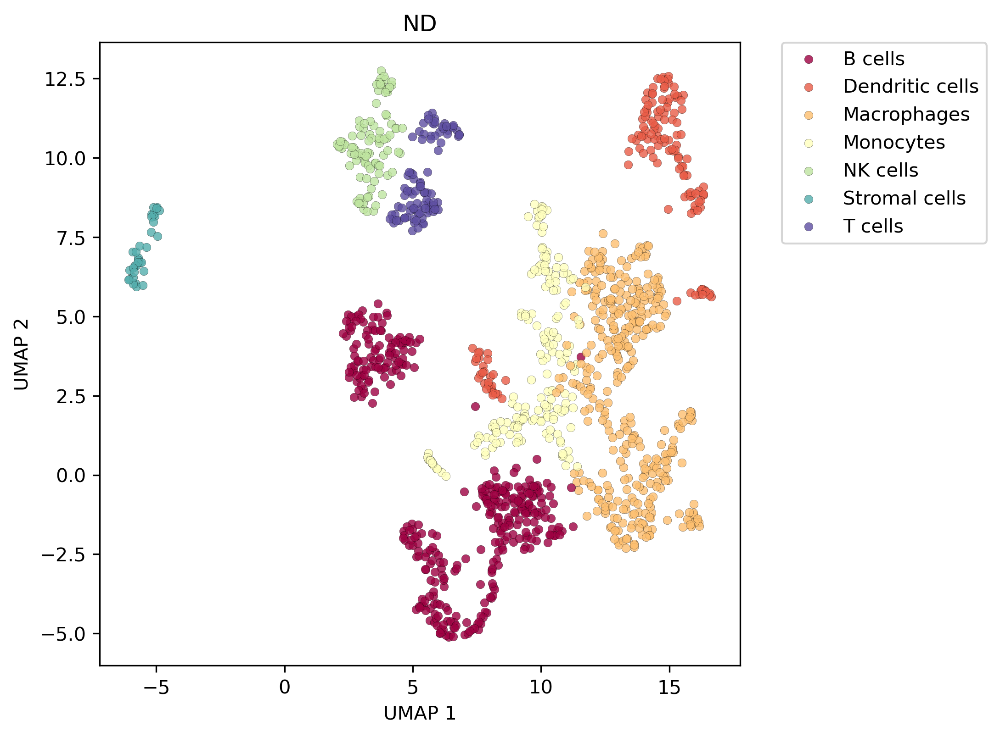

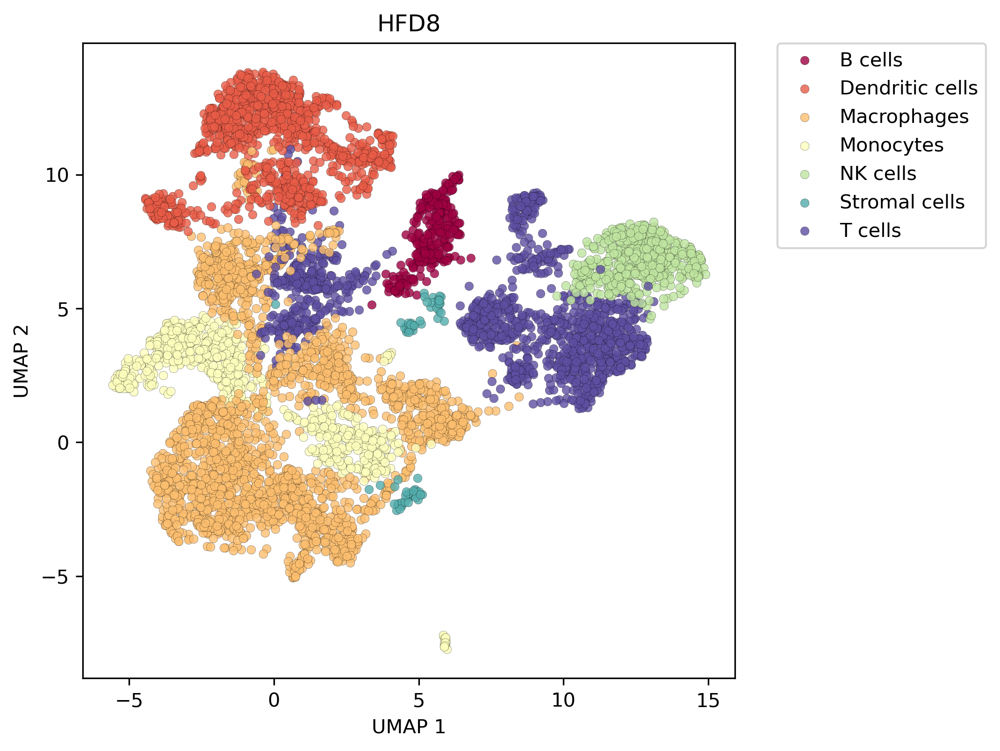

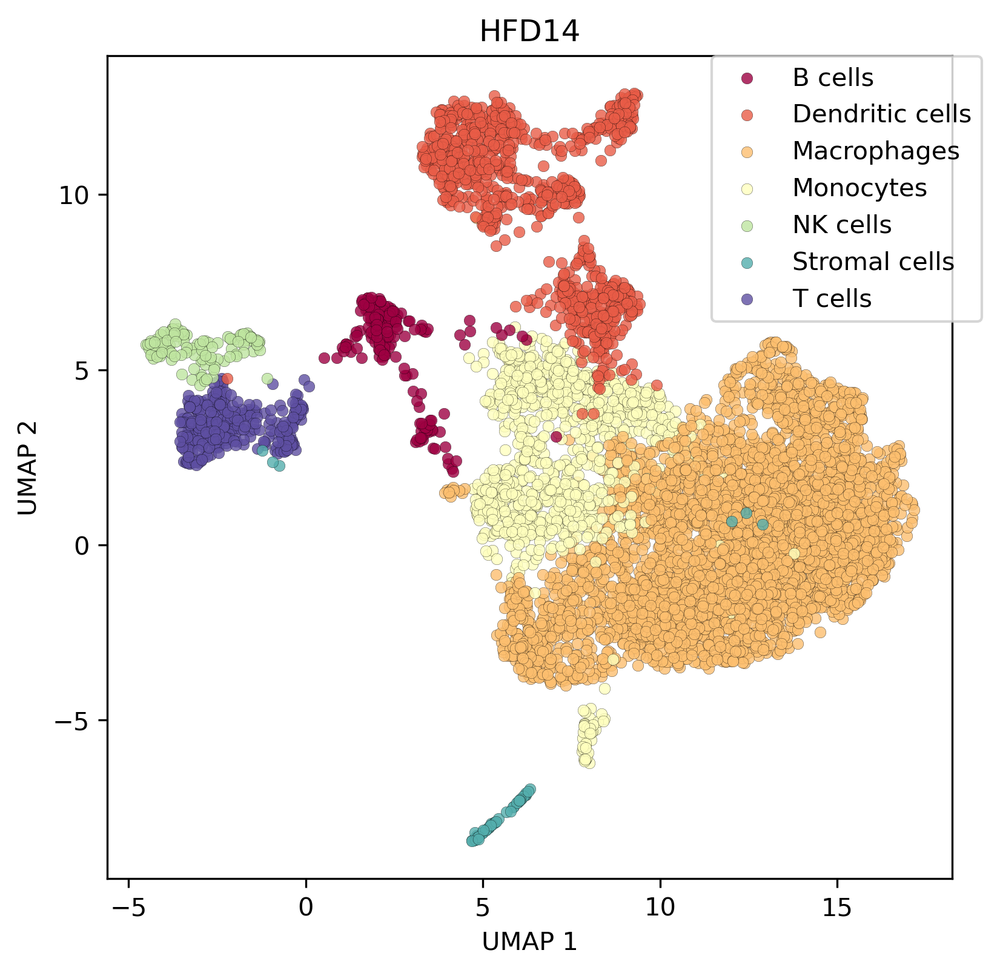

In [18]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 6,6

keys = ['ND', 'HFD8', 'HFD14']

ncolors = markerGenes['cell type'].nunique()
ctypes = sorted(markerGenes['cell type'].unique())

colordict = dict(zip(ctypes, ut.ncolor(ncolors, cmap='Spectral')))


for key in keys:
    data = adata[key]
    
    clusterIds = data.obs[runKey].astype(int).to_numpy()
    cellTypes = cellTypebyMax(scoreFrame[key])
    
    nCellTypes = cellTypes['cellType'].nunique()
    k = data.obs[runKey].nunique()
    
    embedding = data.obsm['X_umap']
    
    seenlabels = []
    for i in range(k):
        label = cellTypes[cellTypes['clusterId'] == (i+1)]['cellType'].values[0]
        
        if not label in seenlabels:
            seenlabels.append(label)
        
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8,
                        label=label)
            
        else:
            plt.scatter(embedding[clusterIds == i , 0] , 
                        embedding[clusterIds == i , 1] , 
                        c=colordict[label],
                        edgecolor="k",
                        linewidth=0.1,
                        s=20,
                        alpha=0.8)
    
    plt.title(key)
    # sort both labels and handles by labels
    handles, labels = plt.gca().get_legend_handles_labels()
    labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
    plt.legend(handles, labels, bbox_to_anchor=(1.05, 1.015))
    plt.xlabel("UMAP 1")
    plt.ylabel("UMAP 2")
    # plt.savefig(f'{key}.png', bbox_inches='tight')
    plt.show()


/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).t

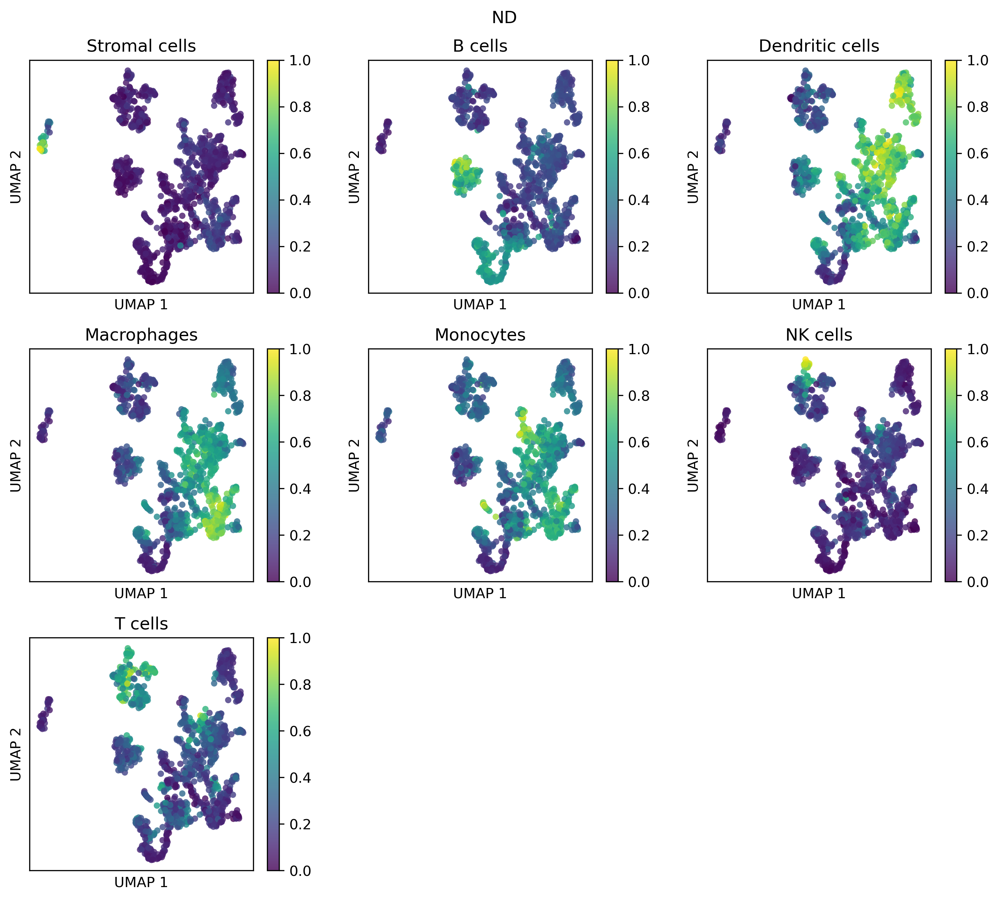

/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).t

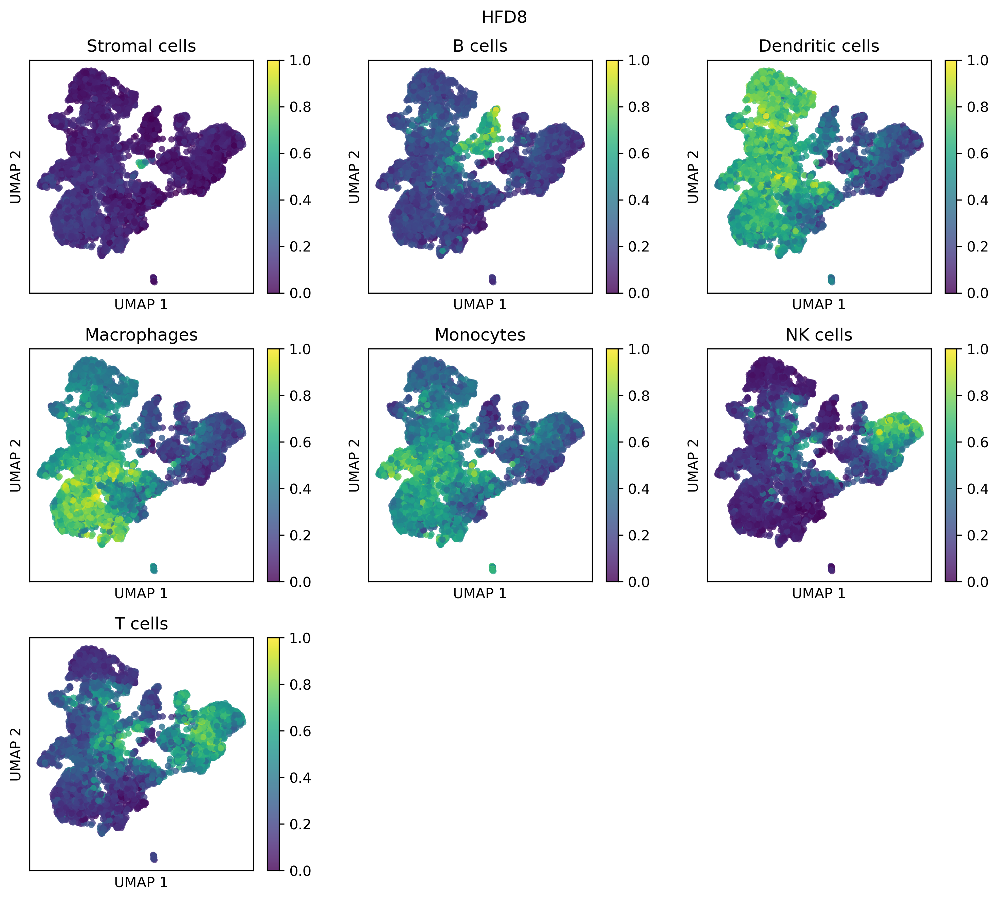

/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).to_numpy()
/tmp/ipykernel_855525/307819818.py:38: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  meanGExp = df[intesect].mean(axis=1).t

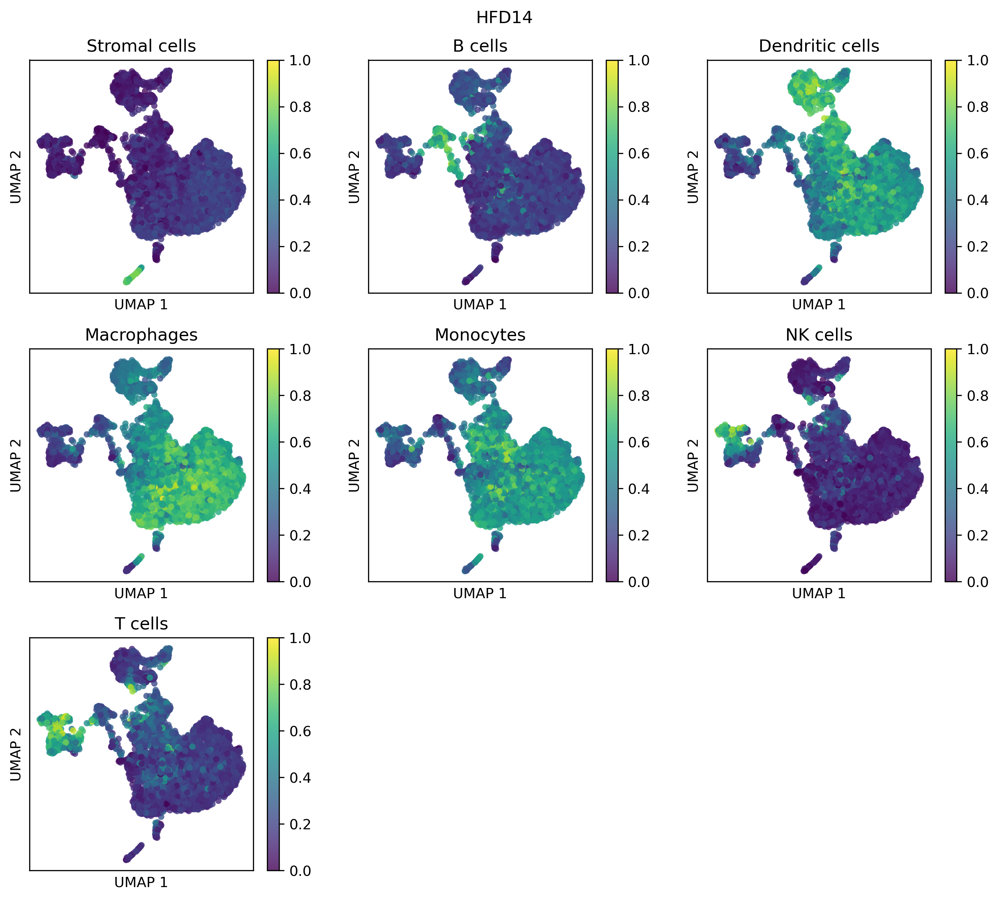

In [19]:
# plot clusters using individual embeddings
# shows how well defined the clusters are at a single time point
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 9

keys = ['ND', 'HFD8', 'HFD14']

includeClusterPlot = False

def nearest_square(num):
    return int(np.ceil(np.sqrt(num))**2)

for key in keys:
    data = adata[key]
    df = data.to_df()
    embedding = data.obsm['X_umap']
    
    nFig = nearest_square(len(ctype) + 1 )
    toRemove = int(nFig - len(ctype)) + 1
    
    fig, axs = plt.subplots(int(np.sqrt(nFig)), int(np.sqrt(nFig)))
    axs = axs.ravel()
    
    bummper = 0
    if includeClusterPlot:    
        img = mpimg.imread(f'{key}.png')
        axs[0].imshow(img)
        axs[0].axis(False)
        bummper = 1
    
    """
    NOTE: we use all the marker genes for this
    """
    for i, ctype in enumerate(allMarkers['cell type'].unique()):
        mGenes = allMarkers[allMarkers['cell type'] == ctype]['gene'].to_list()
        intesect = set(df.columns).intersection(set(mGenes))
        
        meanGExp = df[intesect].mean(axis=1).to_numpy()
        meanGExp *= (1.0/meanGExp.max())
        
        p = axs[i+bummper].scatter(embedding[: , 0] , 
                       embedding[:, 1] , 
                       c=meanGExp,
                       edgecolor="None",
                       s=20,
                       alpha=0.8,
                       vmin=0,
                       vmax=1)
        
        plt.colorbar(p, ax=axs[i+bummper])
        
        axs[i+bummper].set_xticks([])
        axs[i+bummper].set_yticks([])
        axs[i+bummper].set_xlabel('UMAP 1')
        axs[i+bummper].set_ylabel('UMAP 2')
        axs[i+bummper].set_title(ctype)

    plt.suptitle(key)
    plt.tight_layout()
    # clean up the plot
    for k in range((i+1+bummper), (i+toRemove)):
        axs[k].set_axis_off()

    plt.show()

          cellType  proportion    color
0          T cells    0.073751  #5e4fa2
1    Stromal cells    0.026170  #54aead
2         NK cells    0.076130  #bfe5a0
3        Monocytes    0.138779  #ffffbe
4      Macrophages    0.284695  #fdbf6f
5  Dendritic cells    0.113402  #e95c47
6          B cells    0.287074  #9e0142


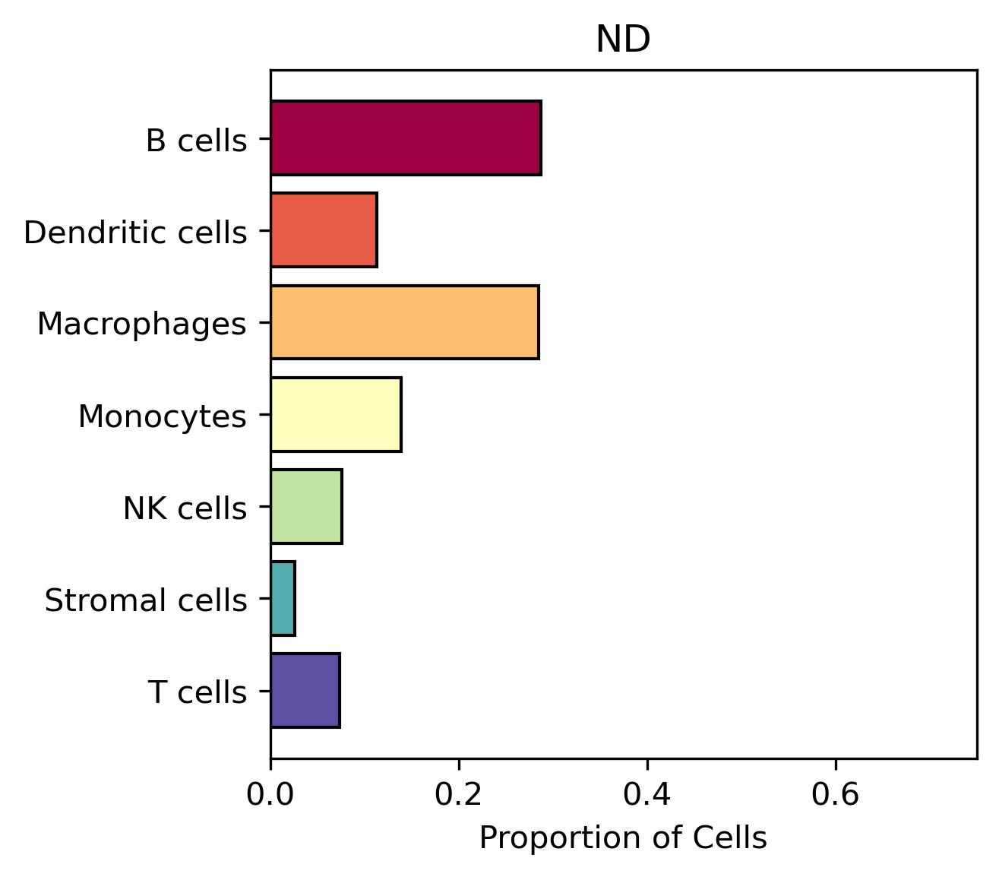

          cellType  proportion    color
0          T cells    0.211988  #5e4fa2
1    Stromal cells    0.012739  #54aead
2         NK cells    0.082476  #bfe5a0
3        Monocytes    0.116610  #ffffbe
4      Macrophages    0.357341  #fdbf6f
5  Dendritic cells    0.172791  #e95c47
6          B cells    0.046056  #9e0142


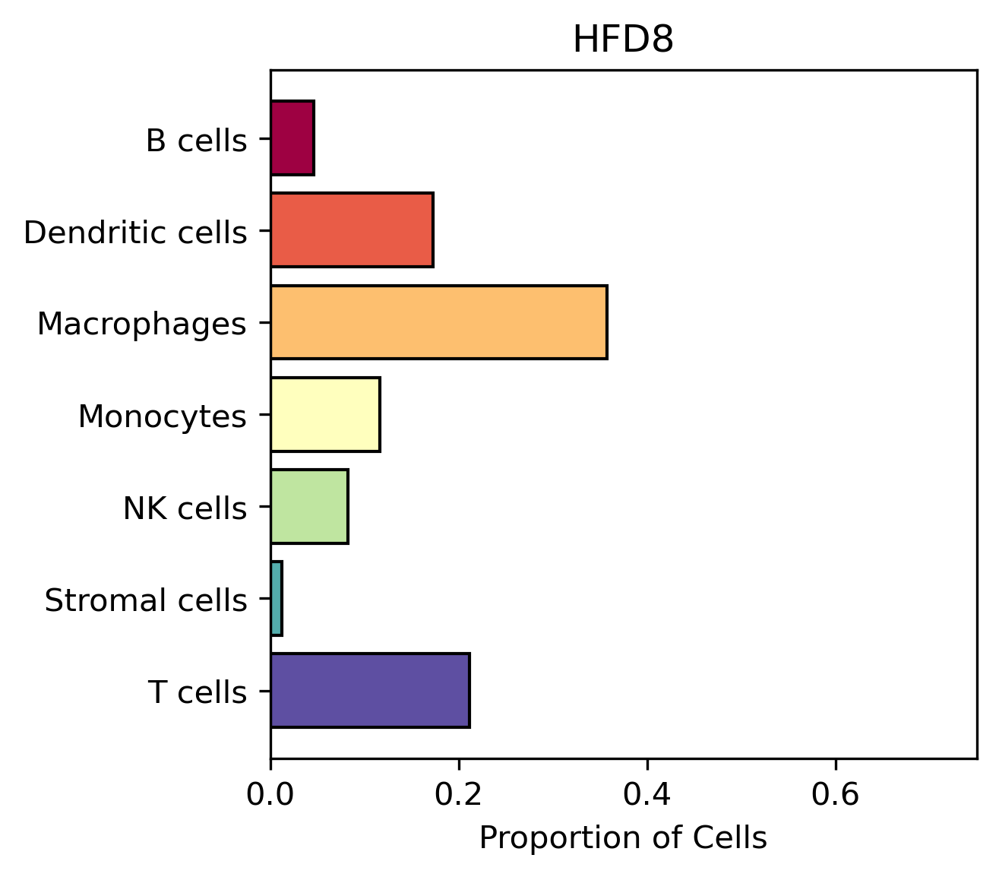

          cellType  proportion    color
0          T cells    0.046457  #5e4fa2
1    Stromal cells    0.008390  #54aead
2         NK cells    0.019422  #bfe5a0
3        Monocytes    0.156774  #ffffbe
4      Macrophages    0.603480  #fdbf6f
5  Dendritic cells    0.137042  #e95c47
6          B cells    0.028434  #9e0142


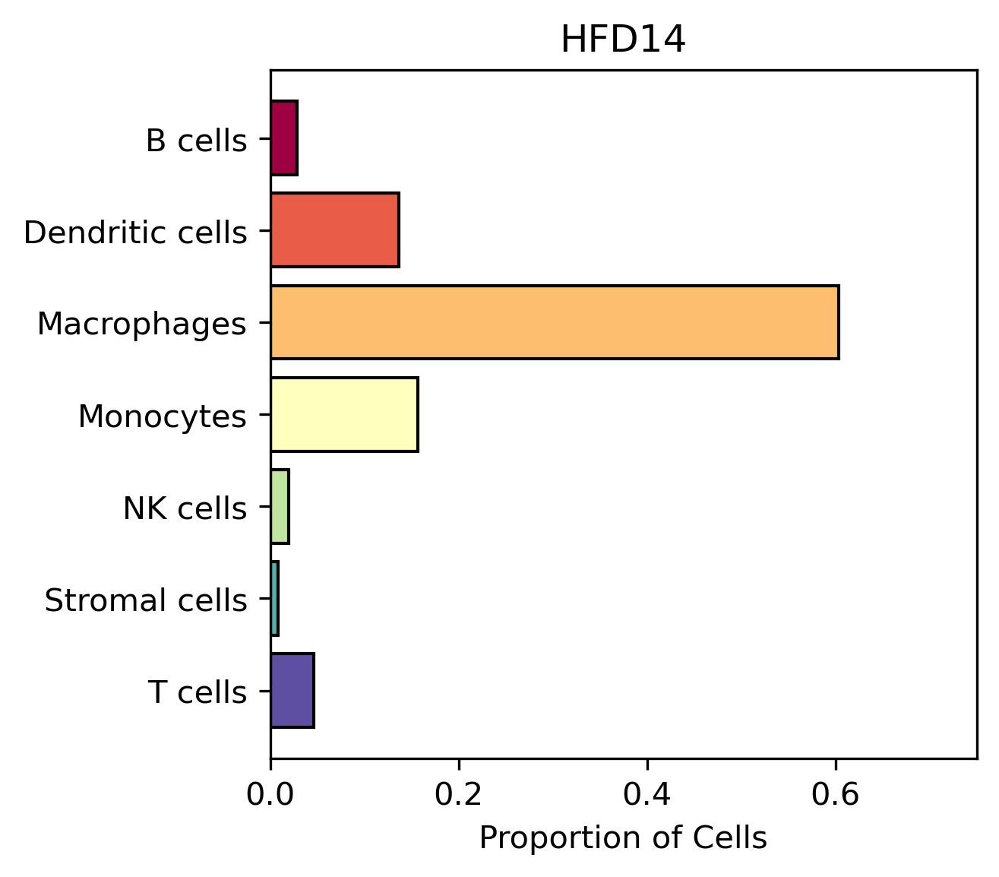

In [20]:
keys = ['ND', 'HFD8', 'HFD14']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4
xbuff = 1.8
ybuff = 1.8

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    
    clusterCount = pd.DataFrame(data.obs[runKey].astype(int).value_counts(normalize=True))
    clusterCount.columns = ['proportion'] 
    clusterCount['clusterId'] = clusterCount.index + 1
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = pd.merge(cellTypes,
                         clusterCount, 
                         on='clusterId', 
                         how='left')
    
    grped = cellTypes.groupby('cellType')['proportion'].sum()
    grped = grped.sort_index(ascending=False).reset_index()
    
    grped['color'] = grped['cellType'].map(colordict)
    
    
    
    plt.barh(grped['cellType'],
             grped['proportion'],
             color=grped['color'],
             edgecolor='k')
    plt.xlabel('Proportion of Cells')
    plt.xlim([0, 0.75])
#     ctypeList = grped['cellType'].to_list()
#     prop = grped['proportion'].to_list()
    
#     _ = plt.pie(grped['proportion'],
#                             # labels=grped['cellType'],
#                             wedgeprops={'edgecolor':"k",
#                                         'linewidth': 1,
#                                         'width':1.0},
#                             colors=grped['color'],
#                             pctdistance=0.6, 
#                             startangle=21)
    

    print(grped)
    plt.ylabel("")
    plt.title(key)
    plt.show()

# Store data

In [21]:
outpath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"

keys = ['ND', 'HFD8', 'HFD14']
for key in keys:
    data = adata[key]
    fName = f"{outpath}{key}.h5ad"
    data.write(fName)
    print(f"done: {fName}")

done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/ND.h5ad
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD8.h5ad
done: /nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/HFD14.h5ad


# Store Cluster Assignments

In [22]:
outpath = "clusterAssignments.csv"

keys = ['ND', 'HFD8', 'HFD14']

dfList = []

for key in keys:
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    dfList.append(cellTypes)
    
res = pd.concat(dfList, ignore_index=True)
res.to_csv(outpath, index=False)
print("done")

done


# Store signatures


In [23]:
keys = ['ND', 'HFD8', 'HFD14']

for key in keys:
    data = adata[key]
    df = data.to_df()
    
    
    result = data.uns['rank_genes_groups']
    dataKeys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    clusterIds = data.obs[runKey].astype(int)
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = cellTypes.sort_values(by='clusterId', ascending=False)
    diffs = scoreDiffs[key]
    allscores = scoreFrame[key]
    
    """
    BUILD EXCEL BOOK
    """
    outputDir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/"
    fname = f"{outputDir}{key}_clusterResults.xlsx"
    print(f'working {key}...')
    
    cid = enrichr[key]
    
    with pd.ExcelWriter(fname) as writer:  
        cellTypes.to_excel(writer, sheet_name=f'{key}_clusters', index=False)
        diffs.to_excel(writer, sheet_name=f'{key}_diffs', index=False)
        allscores.to_excel(writer, sheet_name=f'{key}_allScores', index=False)
        
        for clusterId in groups:
            t = pd.DataFrame(result['names'][clusterId])
            t.columns = ['gene']
            t['scores'] = result['scores'][clusterId]
            t['pvals'] = result['pvals'][clusterId]
            t['clusterId'] = int(clusterId) + 1
            t['logfoldchanges'] = result['logfoldchanges'][clusterId]
            
            # # compute log-fold changes
            # mask = (clusterIds.isin([int(clusterId)]))
            # inCluster = df[mask]
            # outCluster = df[~mask]
            
#             lfc = []
            
#             for g in t['gene']:
#                 meanGroup = inCluster[g].mean() # cells in cluster
#                 meanRest = outCluster[g].mean() # cells not in cluster
                
#                 fc = np.log2(np.abs(np.expm1(meanGroup) / np.expm1(meanRest)))
#                 lfc.append(fc)
              
#             t['LFC'] = lfc
            sheetName = f"cluster_{int(clusterId) + 1}_custom"
            t.to_excel(writer, sheet_name=sheetName, index=False)
            
            edf = cid[int(clusterId)+1]
            sheetName = f"cluster_{int(clusterId) + 1}_enrichr"
            edf.to_excel(writer, sheet_name=sheetName, index=False)
            

print('done')

working ND...
working HFD8...
working HFD14...
done


In [29]:
""" Store simple files """

output = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/scanpy/clusters.csv"

keys = ['ND', 'HFD8', 'HFD14']
alpha = 0.05

dfList = []

for key in keys:
    data = adata[key]
    df = data.to_df()
    
    
    result = data.uns['rank_genes_groups']
    dataKeys = data.uns['rank_genes_groups'].keys()
    groups = result['names'].dtype.names
    clusterIds = data.obs[runKey].astype(int)
    
    cellTypes = cellTypebyMax(scoreFrame[key])
    cellTypes = cellTypes.sort_values(by='clusterId', ascending=False)
    
      
    for clusterId in groups:
        
        cid = int(clusterId) + 1
        label = cellTypes[cellTypes['clusterId'] == cid]['cellType'].values[0]
        t = pd.DataFrame(result['names'][clusterId])
        t.columns = ['gene']
        t['scores'] = result['scores'][clusterId]
        t['pvals'] = result['pvals'][clusterId]
        t['logfoldchanges'] = result['logfoldchanges'][clusterId]
        t['clusterId'] = int(clusterId) + 1
        t = t[t['pvals'] < alpha]
        
        t['key'] = key
        t['cellType'] = label
        
        dfList.append(t)
    
res = pd.concat(dfList, ignore_index=True)
res.to_parquet(output, index=False)
print(res.shape)
res.head()

(427882, 7)


,gene,scores,pvals,logfoldchanges,clusterId,key,cellType
0,H2-EB1,36.343353,4.575346e-181,3.564091,1,ND,Macrophages
1,H2-AA,35.311523,4.761517e-183,3.430534,1,ND,Macrophages
2,H2-AB1,34.411163,2.815112e-177,3.234597,1,ND,Macrophages
3,CD74,33.910587,2.451588e-177,3.302062,1,ND,Macrophages
4,H2-DMA,31.695400,2.991793e-123,2.667091,1,ND,Macrophages


In [25]:
# keys = ['ND', 'HFD8', 'HFD14']
# method = 'wilcoxon'
# nGenes = 100

# for key in keys:
#     data = adata[key] 
#     sc.pp.filter_genes(data, min_cells=10)
#     sc.pp.scale(data, max_value=10)
#     sc.tl.rank_genes_groups(data, 
#                             runKey, 
#                             rankby_abs=True,
#                             n_genes=nGenes,
#                             method=method)
    
#     result = data.uns['rank_genes_groups']
#     dataKeys = data.uns['rank_genes_groups'].keys()
#     groups = result['names'].dtype.names
    
#     print(result['logfoldchanges'][1])
    
                            
#     break

In [26]:
# ?sc.tl.rank_genes_groups

In [27]:
?sc.pp.scale

Signature:
sc.pp.scale(
    X: Union[anndata._core.anndata.AnnData, scipy.sparse.base.spmatrix, numpy.ndarray],
    zero_center: bool = True,
    max_value: Optional[float] = None,
    copy: bool = False,
    layer: Optional[str] = None,
    obsm: Optional[str] = None,
)
Docstring:
Scale data to unit variance and zero mean.

.. note::
    Variables (genes) that do not display any variation (are constant across
    all observations) are retained and (for zero_center==True) set to 0
    during this operation. In the future, they might be set to NaNs.

Parameters
----------
X : typing.Union[anndata._core.anndata.AnnData, scipy.sparse.base.spmatrix, numpy.ndarray]
    The (annotated) data matrix of shape `n_obs` × `n_vars`.
    Rows correspond to cells and columns to genes.
zero_center : bool, optional (default: True)
    If `False`, omit zero-centering variables, which allows to handle sparse
    input efficiently.
max_value : typing.Optional[float], optional (default: None)
    Clip (tru